## **2.2 Google Colab - Simple_ImgProcessing**


# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


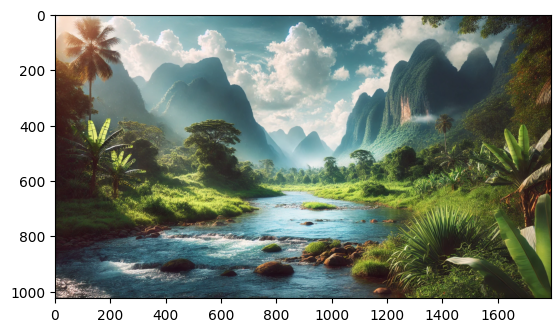

In [ ]:
img1 = mpimg.imread('/content/Dalle_paisaje.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [ ]:
img1.shape

(1024, 1792, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

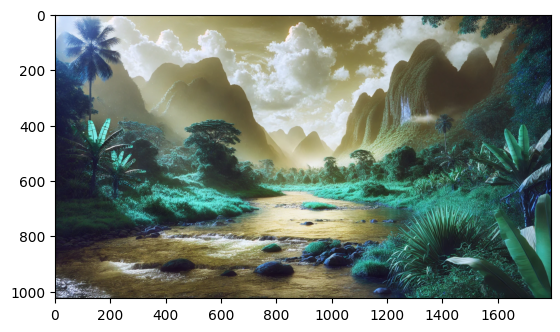

In [ ]:
img2 = cv2.imread('/content/Dalle_paisaje.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB).

Let's fix that

AxesImage(shape=(1024, 1792, 3))


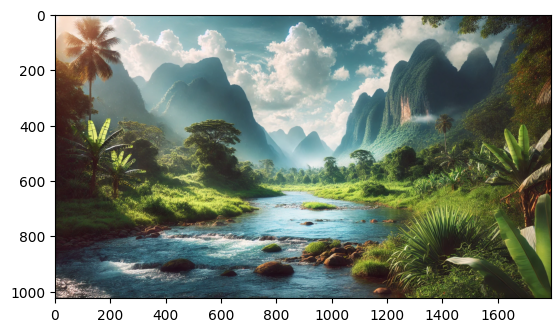

In [ ]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.WebPImagePlugin.WebPImageFile'>


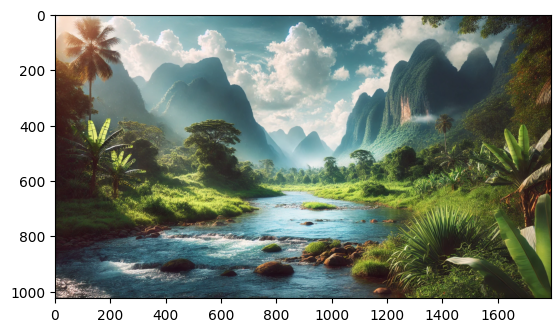

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('/content/Dalle_paisaje.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [ ]:
img3 = np.array(img3)
img3.shape

(1024, 1792, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

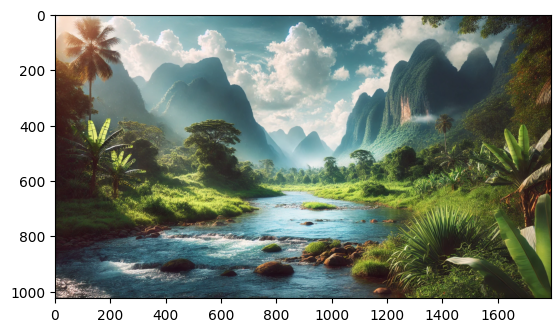

In [ ]:
# Save the image
np.save('/content/img.npy', img3)

# Load the image
img3 = np.load('/content/img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it.

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 1792 x 1024
New size: 200 x 200


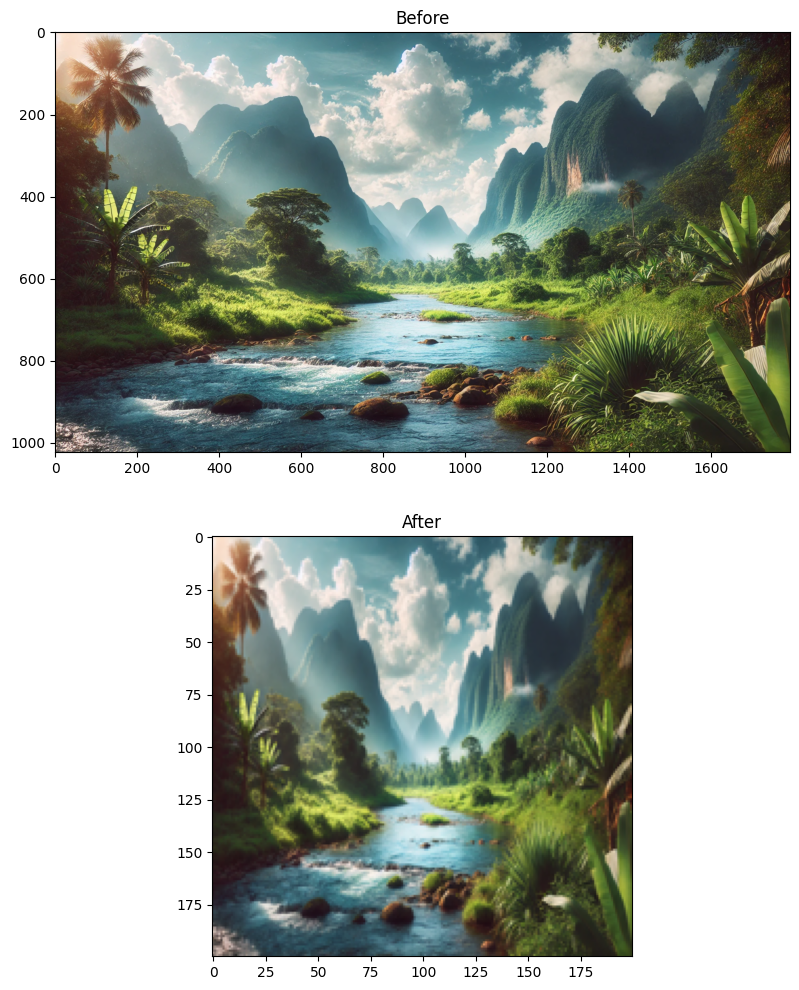

In [ ]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 1792 x 1024
Scaled size: 200 x 114
New size: 200 x 200


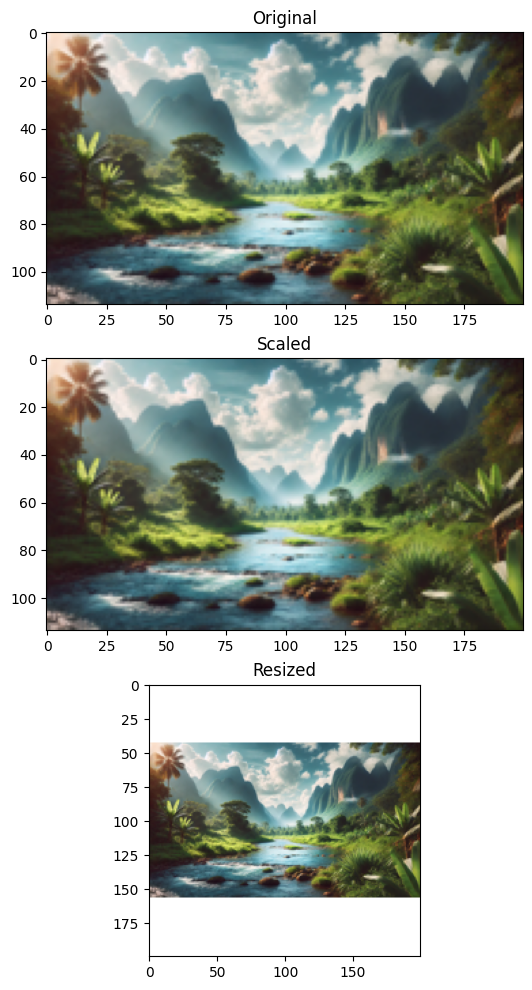

In [ ]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size)
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

# Respuestas a preguntas del encargo

Cargamos la imagen en formato JPG, la convertimos en un array de NumPy y la guardamos como un archivo .npy para su posterior reutilización. Luego, cargamos nuevamente la imagen desde el archivo .npy, la reconvertimos a un objeto de imagen con PIL, la redimensionamos a un tamaño de 200x200 píxeles y la mostramos en pantalla sin ejes para una visualización más clara.

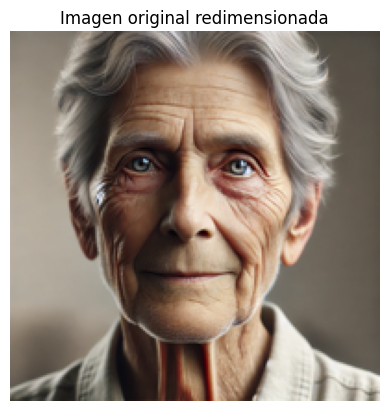

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Cargamos la imagen desde el archivo
img3 = Image.open('/content/Anciano.jpg')

# Convertimos la imagen en un array de NumPy
img3 = np.array(img3)

# Guardamos la imagen como un archivo NumPy
np.save('/content/img.npy', img3)

# Cargamos la imagen desde el archivo NumPy
img3 = np.load('/content/img.npy')

from PIL import Image

# Convertimos el array nuevamente a un objeto de imagen PIL
orig_img = Image.fromarray(img3)

# Redimensionamos la imagen a 200 x 200 píxeles
target_size = (200, 200)
new_img = orig_img.resize(target_size)

# Mostramos únicamente la imagen redimensionada
plt.imshow(new_img)
plt.title('Imagen original redimensionada')
plt.axis('off')  # Ocultamos los ejes para una mejor visualización
plt.show()

**Pregunta 1:** Las transformaciones pixel a pixel son sumamente utilizadas para aumentar la cantidad de imágenes para entrenar modelos de inteligencia artificial, sobre todo aquellas de tipo fotométrico. Investiga 3 tipos de transformaciones y aplicarlas en el proyecto de Google Collab sobre imágenes propias.

*Las transformaciones de brillo, contraste y ruido son herramientas clave en el procesamiento de imágenes y en la inteligencia artificial (IA), especialmente en técnicas de data augmentation. Estas transformaciones ajustan los valores de los píxeles para enriquecer los conjuntos de datos y mejorar la capacidad de generalización de los modelos.*

**Primera transformación: Ajuste de brillo**

*El brillo modifica la intensidad de los píxeles, simulando condiciones de iluminación variadas como días soleados o interiores oscuros. Según Goodfellow, Bengio y Courville (2016), enriquecer los datos con variaciones de brillo mejora la capacidad de los modelos para adaptarse a cambios en la iluminación.*

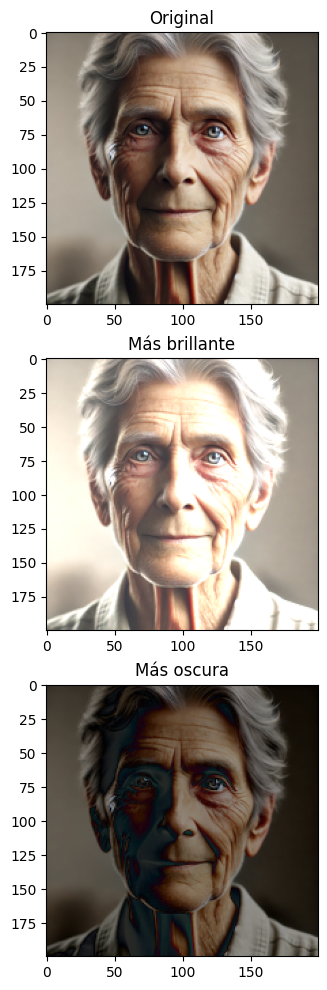

In [ ]:
# Ajustamos el brillo aumentando los valores de los píxeles
bright_img = cv2.convertScaleAbs(np.array(new_img), alpha=1.2, beta=50)  # Aumentamos el brillo
dark_img = cv2.convertScaleAbs(np.array(new_img), alpha=0.8, beta=-50)   # Reducimos el brillo

# Mostramos la imagen redimensionada y las ajustadas en brillo
fig = plt.figure(figsize=(12, 12))

# Imagen redimensionada (original en este contexto)
a = fig.add_subplot(3, 1, 1)
imgplot = plt.imshow(new_img)
a.set_title('Original')

# Imagen más brillante
a = fig.add_subplot(3, 1, 2)
imgplot = plt.imshow(bright_img)
a.set_title('Más brillante')

# Imagen más oscura
a = fig.add_subplot(3, 1, 3)
imgplot = plt.imshow(dark_img)
a.set_title('Más oscura')

plt.show()

**Segunda Transformación: Ajuste de contraste**

*El contraste realza o suaviza las diferencias entre áreas claras y oscuras, útil en tareas como el reconocimiento de objetos. Como indican Goodfellow et al. (2016), estas variaciones ayudan a los modelos a manejar datos con diferentes características visuales.*

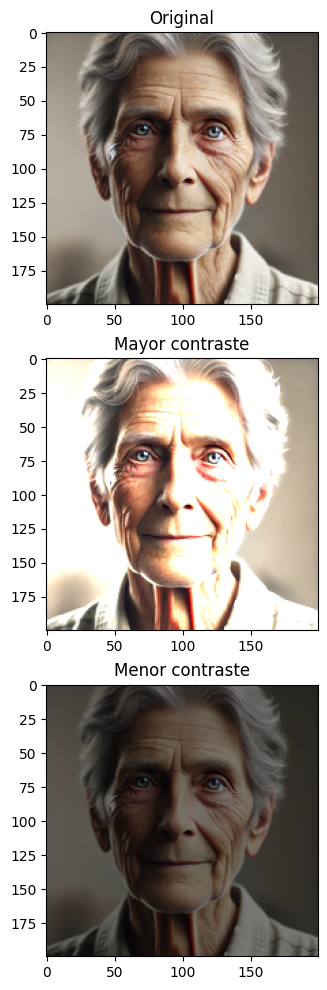

In [ ]:
# Ajustamos el contraste escalando los valores de los píxeles
high_contrast_img = cv2.convertScaleAbs(np.array(new_img), alpha=2.0, beta=0)  # Aumentamos el contraste
low_contrast_img = cv2.convertScaleAbs(np.array(new_img), alpha=0.5, beta=0)   # Reducimos el contraste

# Mostramos la imagen redimensionada y las ajustadas en contraste
fig = plt.figure(figsize=(12, 12))

# Imagen redimensionada (original en este contexto)
a = fig.add_subplot(3, 1, 1)
imgplot = plt.imshow(new_img)
a.set_title('Original')

# Imagen con mayor contraste
a = fig.add_subplot(3, 1, 2)
imgplot = plt.imshow(high_contrast_img)
a.set_title('Mayor contraste')

# Imagen con menor contraste
a = fig.add_subplot(3, 1, 3)
imgplot = plt.imshow(low_contrast_img)
a.set_title('Menor contraste')

plt.show()

**Tercera Transformación: Adición de ruido**

*El ruido simula imperfecciones como grano digital o interferencias, mejorando la robustez de los modelos frente a datos imperfectos. Nazaré et al. (2018) destacan que el entrenamiento con datos ruidosos prepara a los modelos para condiciones de baja calidad. Shorten y Khoshgoftaar (2019) enfatizan que estas transformaciones son esenciales para aumentar la variabilidad de los datos y garantizar que los modelos sean más robustos ante condiciones adversas.*

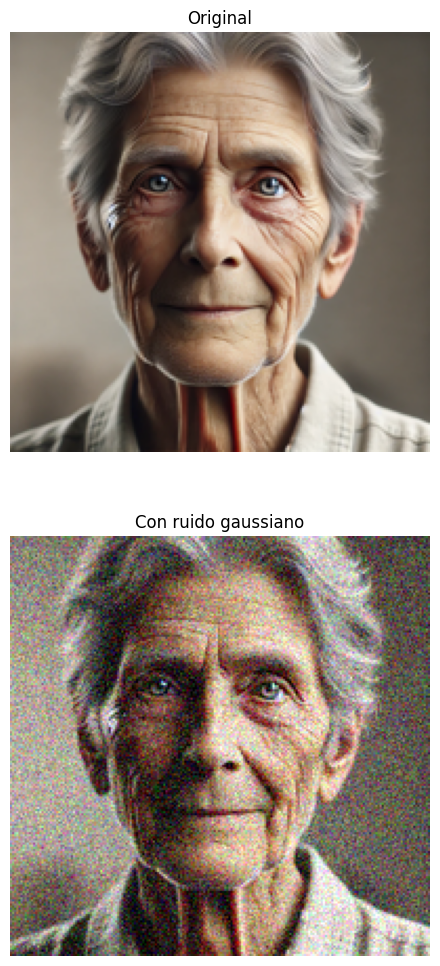

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definimos la función para agregar ruido gaussiano a la imagen redimensionada
def add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape)  # Generamos ruido gaussiano
    noisy_image = np.clip(image + noise, 0, 255).astype(np.uint8)  # Aseguramos valores válidos
    return noisy_image

# Suponemos que 'new_img' es la imagen redimensionada previamente cargada
# new_img = ...

# Convertimos la imagen redimensionada a un array NumPy y agregamos ruido
noisy_img = add_gaussian_noise(np.array(new_img))

# Mostramos la imagen redimensionada y la imagen con ruido
fig = plt.figure(figsize=(12, 12))

# Imagen redimensionada (original en este contexto)
ax1 = fig.add_subplot(2, 1, 1)
ax1.imshow(new_img)
ax1.set_title('Original')
ax1.axis('off')  # Ocultamos los ejes

# Imagen con ruido gaussiano
ax2 = fig.add_subplot(2, 1, 2)
ax2.imshow(noisy_img)
ax2.set_title('Con ruido gaussiano')
ax2.axis('off')  # Ocultamos los ejes

plt.show()

**Pregunta 2:** Investiga una aplicación donde obtener el negativo de imagen tenga un valor específico e integra el código en en una fila de google collab, justificar brevemente tu investigación y haciendo una demo sencilla.

*El uso del negativo en radiografías mejora la visualización de detalles relevantes, como fracturas o anomalías, al resaltar estructuras que podrían pasar desapercibidas en la imagen original. Esta técnica también enriquece los conjuntos de datos para entrenar modelos de inteligencia artificial, haciéndolos más robustos frente a variaciones visuales y artefactos (Shorten & Khoshgoftaar, 2019).*

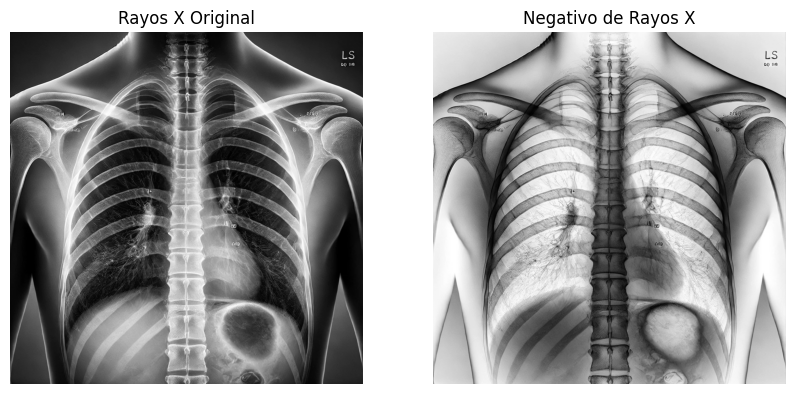

In [ ]:
# Cargamos la imagen médica (rayos X) en escala de grises
img_path = '/content/Rayos_X2.jpg'  # Ruta de la imagen médica generada
xray_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Generamos el negativo de la imagen
negative_img = 255 - xray_img

# Mostramos la imagen original y su negativo
fig = plt.figure(figsize=(10, 5))

# Imagen original
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(xray_img, cmap='gray')
ax1.set_title('Rayos X Original')
ax1.axis('off')

# Imagen negativa
ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(negative_img, cmap='gray')
ax2.set_title('Negativo de Rayos X')
ax2.axis('off')

plt.show()

**Pregunta 3:** Investiga una aplicación donde se puede aplicar la corrección de gamma en una imagen. Integra el código en en una fila de google collab, justifica brevemente tu investigación y haz una demo sencilla.

*La corrección de gamma se utiliza para ajustar la luminosidad de una imagen en función de una curva no lineal, lo cual es especialmente útil en imágenes médicas. Este ajuste mejora la visualización de detalles en regiones oscuras o muy iluminadas, siendo clave en análisis como tomografías, resonancias magnéticas y radiografías, donde el rango dinámico de las imágenes puede dificultar la percepción de estructuras importantes. En imágenes de resonancia magnética, por ejemplo, la corrección de gamma permite resaltar detalles en tejidos blandos que podrían no ser evidentes debido a la distribución de luminosidad en la imagen original (Goodfellow et al., 2016).*

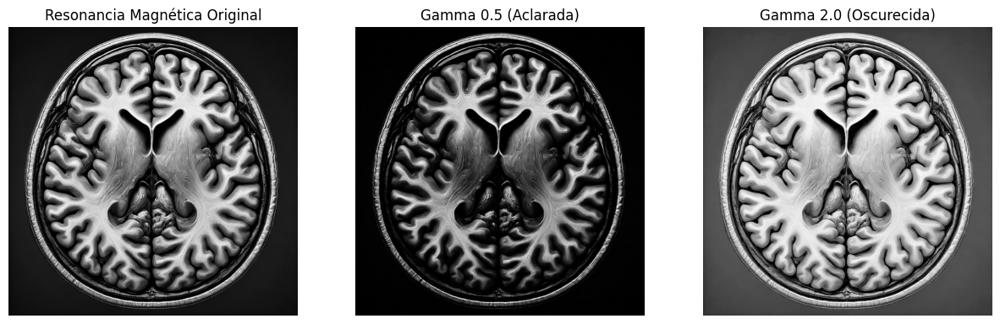

In [ ]:
# Cargamos la imagen médica (resonancia magnética) en escala de grises
img_path = '/content/Resonancia.jpg'  # Ruta de la imagen MRI generada
mri_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Función para aplicar corrección de gamma
def apply_gamma_correction(image, gamma=1.0):
    # Construimos una tabla de búsqueda para mapear los valores de píxel [0, 255] a sus valores ajustados por gamma
    invGamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(0, 256)]).astype("uint8")
    # Aplicamos la corrección de gamma usando la tabla de búsqueda
    return cv2.LUT(image, table)

# Aplicamos corrección de gamma con diferentes valores
gamma_low = apply_gamma_correction(mri_img, 0.5)  # Aclara la imagen
gamma_high = apply_gamma_correction(mri_img, 2.0)  # Oscurece la imagen

# Mostramos las imágenes
fig = plt.figure(figsize=(15, 5))

# Imagen original
ax1 = fig.add_subplot(1, 3, 1)
ax1.imshow(mri_img, cmap='gray')
ax1.set_title('Resonancia Magnética Original')
ax1.axis('off')

# Imagen con gamma bajo
ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(gamma_low, cmap='gray')
ax2.set_title('Gamma 0.5 (Aclarada)')
ax2.axis('off')

# Imagen con gamma alto
ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(gamma_high, cmap='gray')
ax3.set_title('Gamma 2.0 (Oscurecida)')
ax3.axis('off')

plt.show()

**Pregunta 4:** Investiga una aplicación donde se puede usar la sustracción de imágenes e integra el código en en una fila de google collab, justificar brevemente tu investigación, haciendo una demo sencilla.

*La sustracción de imágenes es ampliamente utilizada en angiografía digital por sustracción (DSA) para resaltar estructuras vasculares, eliminando elementos superpuestos como huesos o tejidos. También se aplica en estudios longitudinales para detectar cambios en lesiones o tumores, facilitando el monitoreo de enfermedades y evaluando la respuesta a tratamientos. La técnica permite resaltar detalles específicos, como vasos sanguíneos o cambios en tejidos, siendo clave en el diagnóstico y monitoreo médico.*

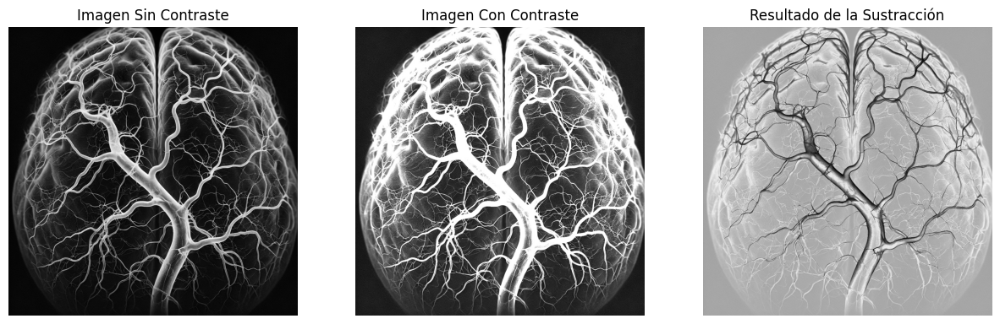

In [ ]:
# Cargamos las imágenes médicas: pre y post contraste
img_pre_path = '/content/Imagen_Sin_Contraste.jpg'  # Ruta de la imagen sin contraste
img_post_path = '/content/Imagen_Con_Contraste.jpg'  # Ruta de la imagen con contraste

img_pre = cv2.imread(img_pre_path, cv2.IMREAD_GRAYSCALE)
img_post = cv2.imread(img_post_path, cv2.IMREAD_GRAYSCALE)

# Realizamos la sustracción de imágenes
subtracted_img = cv2.absdiff(img_post, img_pre)

# Mostramos las imágenes originales y el resultado de la sustracción
fig = plt.figure(figsize=(15, 5))

# Imagen pre-contraste
ax1 = fig.add_subplot(1, 3, 1)
ax1.imshow(img_pre, cmap='gray')
ax1.set_title('Imagen Sin Contraste')
ax1.axis('off')

# Imagen post-contraste
ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(img_post, cmap='gray')
ax2.set_title('Imagen Con Contraste')
ax2.axis('off')

# Imagen resultante (sustracción)
ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(subtracted_img, cmap='gray')
ax3.set_title('Resultado de la Sustracción')
ax3.axis('off')

plt.show()

**Referencias:**



*   Goodfellow, I., Bengio, Y., & Courville, A. (2016). Deep Learning. MIT Press. [link text](https://www.deeplearningbook.org/)
*   Nazaré, T. S., Paranhos da Costa, G. B., Contato, W. A., & Ponti, M. A. (2018). Deep Convolutional Neural Networks and Noisy Images. En Progress in Pattern Recognition, Image Analysis, Computer Vision, and Applications (pp. 416–424). Springer, Cham. [link text](https://doi.org/10.1007/978-3-319-75193-1_50)
*   Shorten, C., & Khoshgoftaar, T. M. (2019). A survey on image data augmentation for deep learning. Journal of Big Data, 6(1), 1-48. [link text](https://doi.org/10.1186/s40537-019-0197-0)

*   OpenAI. (2025). Medical X-ray image of a human chest [Imagen generada por inteligencia artificial]. DALL·E.

*   OpenAI. (2025). Highly realistic grayscale MRI scan of a human brain [Imagen generada por inteligencia artificial]. DALL·E.
* OpenAI. (2025). A highly realistic portrait of an elderly person [Imagen generada con inteligencia artificial]. DALL·E.

* OpenAI. (2025). Grayscale medical angiography image showing blood vessels [Imagen generada por inteligencia artificial]. DALL·E.





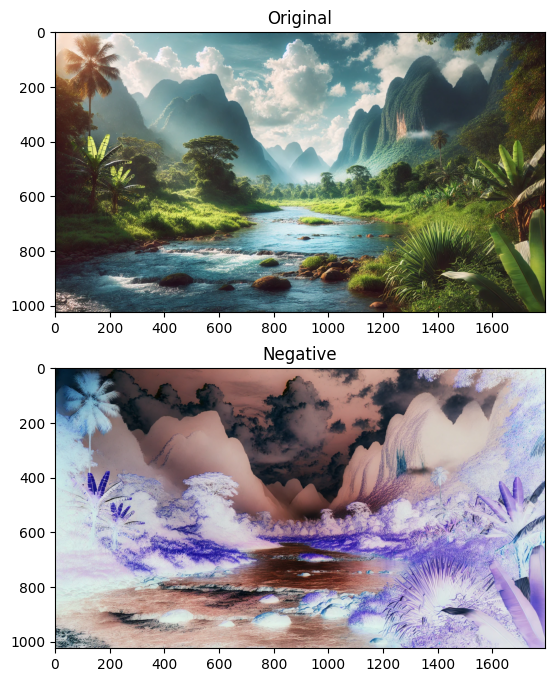

In [ ]:
# Generar el negativo de la imagen cargada
img_neg = 255 - img2

# Mostrar la imagen original y su negativo
fig = plt.figure(figsize=(8, 8))

# Subplot para la imagen original
a = fig.add_subplot(2, 1, 1)
imgplot = plt.imshow(img2)
a.set_title('Original')

# Subplot para la imagen negativa
a = fig.add_subplot(2, 1, 2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

Cargamos una imagen en formato BGR con OpenCV y la convertimos a formato RGB para una visualización correcta. Luego, calculamos su negativo restando los valores de los píxeles a 255, generando una imagen complementaria en color.

In [ ]:
orig_img = cv2.imread('/content/Dalle_paisaje.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

Creamos una figura de 8x8 pulgadas con Matplotlib para visualizar imágenes. En el primer subgráfico, mostramos la imagen original (orig_img) con el título "Original". En el segundo subgráfico, mostramos la versión negativa de la imagen (img_neg) con el título "Negative". Finalmente, utilizamos plt.show() para renderizar y mostrar ambas imágenes en una sola figura.

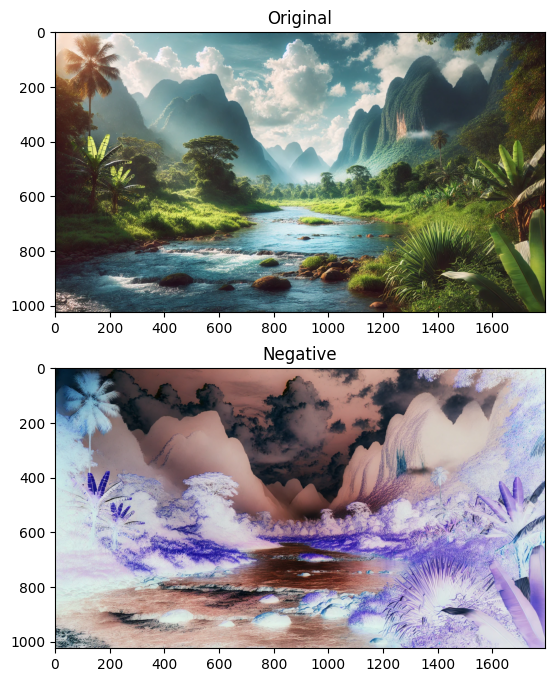

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

Cargamos y convertimos una imagen a formato RGB, aplicando una transformación logarítmica para realzar detalles en áreas oscuras al comprimir el rango dinámico. Finalmente, normalizamos los valores y los convertimos a tipo uint8 para asegurar que la imagen transformada sea válida y visualizable.

In [ ]:
orig_img = cv2.imread('/content/Dalle_paisaje.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
c = 255 / np.log(1 + np.max(orig_img))
log_img = c * (np.log(orig_img + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)

<ipython-input-25-cfe10e5b8363>:6: RuntimeWarning: divide by zero encountered in log
  log_img = c * (np.log(orig_img + 1))
<ipython-input-25-cfe10e5b8363>:10: RuntimeWarning: invalid value encountered in cast
  log_img = np.array(log_img, dtype = np.uint8)


Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

Creamos una figura de 8x8 pulgadas con Matplotlib para comparar imágenes. En el primer subgráfico, mostramos la imagen original (orig_img) con el título "Original". En el segundo subgráfico, mostramos la imagen transformada logarítmicamente (log_img) con el título "Logarithmic Image". Finalmente, utilizamos plt.show() para renderizar ambas imágenes en una sola figura y visualizar los efectos de la transformación.

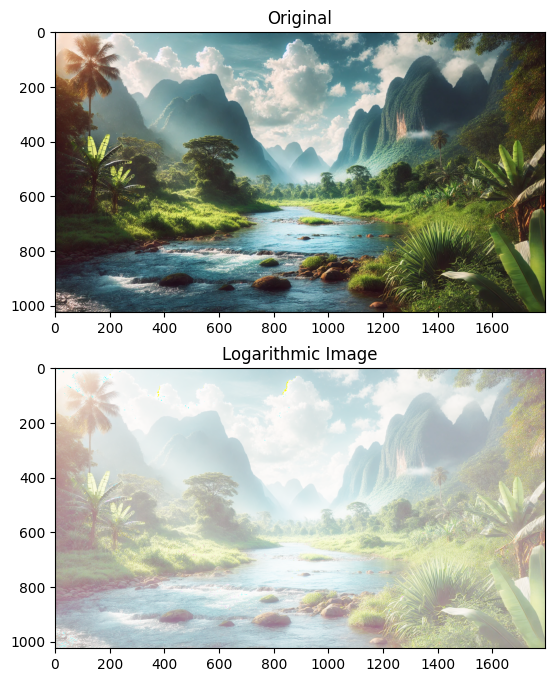

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

El código carga una imagen en formato RGB y aplica cinco métodos de umbralización con OpenCV: binario, binario invertido, truncado, a cero, y a cero invertido. Cada método transforma los valores de los píxeles según un umbral definido (127) y genera una nueva versión de la imagen. Finalmente, se visualizan la imagen original y las transformadas en una cuadrícula con Matplotlib para comparar los efectos de cada método.

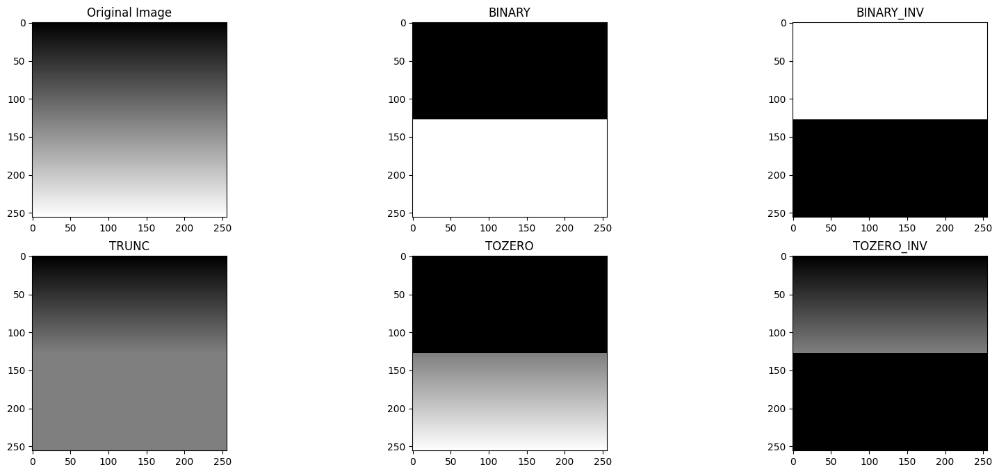

In [ ]:
orig_img = cv2.imread('/content/horizontal_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

El código realiza cuantización de color en una imagen utilizando k-means clustering para reducir la cantidad de colores. La imagen se reorganiza en una matriz, se procesan los píxeles agrupándolos en clusters (K=2, K=5, K=8), y cada píxel es reemplazado por el color promedio de su cluster. Finalmente, se comparan la imagen original y las versiones simplificadas en una cuadrícula, mostrando cómo aumenta el detalle visual al incrementar los valores de K.

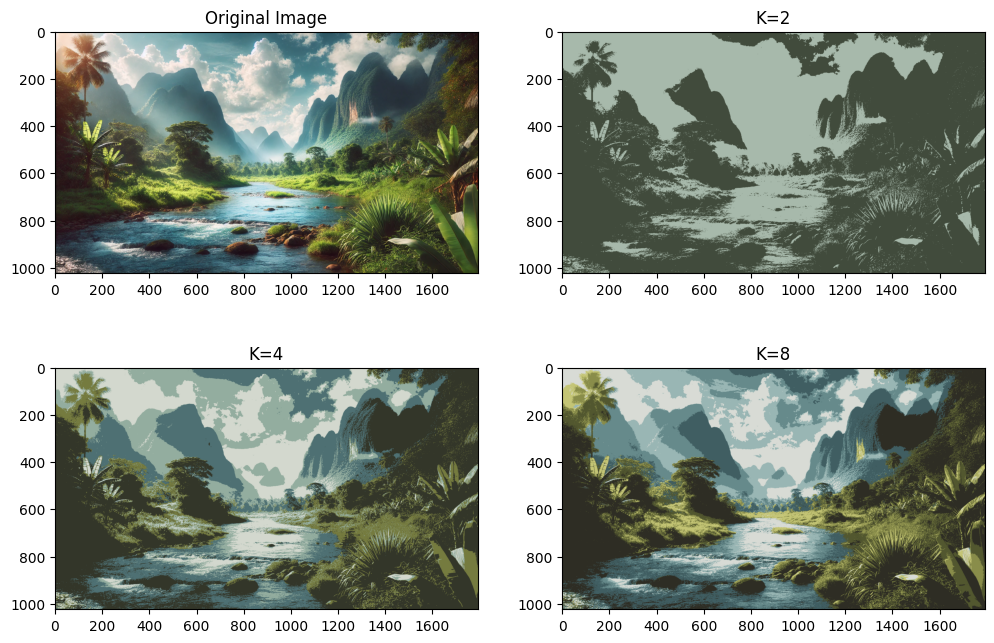

In [ ]:
orig_img = cv2.imread('/content/Dalle_paisaje.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()